# Plot estimated filters in linear-nonlinear model fits to Baker neural data

Examine filters from ridge regression fits.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from disp import set_plot

cc = np.concatenate

FPS = 8.5
DT = 1/FPS
NT = 300
T = DT*np.arange(NT) - 10

IT_STIM = (85, 170)
# IDUR_STIM = IT_STIM[1] - IT_STIM[0]
# DUR_STIM = DT*IDUR_STIM

# T_COLS = [f'IT_{it}' for it in range(NT)]

# IDUR_H = 85
# T_H = np.arange(0, IDUR_H)*DT
# H_T_COLS = [f'IT_H_S_{it}' for it in range(IDUR_H)] + [f'IT_H_P_{it}' for it in range(IDUR_H)]

NT_H = 85
T_H = np.arange(NT_H)*DT

H_S_COLS = [f'IT_H_S_{it}' for it in range(NT_H)]
H_P_COLS = [f'IT_H_P_{it}' for it in range(NT_H)]

In [2]:
# load neural response data
df = pd.read_csv('data/simple/neur/baker.csv')
expt_ids = np.sort(np.unique(df['EXPT_ID']))

df

,EXPT_ID,STIM,LINE,FLY,ROI,ROI_USED,IT_0,IT_1,IT_2,IT_3,...,IT_290,IT_291,IT_292,IT_293,IT_294,IT_295,IT_296,IT_297,IT_298,IT_299
0,0,S,R70G01,0,somas,False,-0.286139,-0.251529,-0.214845,-0.085881,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,P,R70G01,0,somas,False,-0.090690,-0.071585,0.027546,-0.089212,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,S,R70G01,1,somas,False,-0.074163,-0.052967,-0.226459,-0.086673,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,P,R70G01,1,somas,False,-0.094280,-0.175828,-0.132839,-0.155376,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2,S,R70G01,2,somas,False,-0.359071,-0.296972,-0.283760,-0.206650,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443,221,P,vPN1_split,0,somas,False,0.308926,0.069519,-0.028961,-0.103122,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
444,222,S,vPN1_split,1,somas,False,0.268154,0.517779,0.526319,0.353496,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
445,222,P,vPN1_split,1,somas,False,0.563747,0.506288,0.271983,0.002747,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
446,223,S,vPN1_split,2,somas,False,0.023391,0.023677,0.009701,0.006185,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
df_param_lnr = pd.read_csv('data/simple/neur/baker_lnr_fit_param.csv')
df_pred_lnr = pd.read_csv('data/simple/neur/baker_lnr_fit_pred.csv')

In [4]:
df_param_lnr

,EXPT_ID,LINE,FLY,ROI,ROI_USED,FIT_ERR,SUCCESS,IDUR_H,T_0,R_MIN,...,IT_H_P_75,IT_H_P_76,IT_H_P_77,IT_H_P_78,IT_H_P_79,IT_H_P_80,IT_H_P_81,IT_H_P_82,IT_H_P_83,IT_H_P_84
0,0,R70G01,0,somas,False,0.136321,1,85,-0.588235,-3.349445,...,-0.074155,-0.057717,-0.044917,-0.028388,-0.000988,0.011303,0.010067,0.020910,0.029517,0.051020
1,1,R70G01,1,somas,False,0.168554,1,85,-0.000000,-4.068223,...,-0.019098,-0.011020,-0.014008,0.012470,0.029810,0.066632,0.075374,0.094837,0.105833,0.120739
2,2,R70G01,2,somas,False,0.201362,1,85,-0.705882,-4.326501,...,-0.030773,-0.019152,0.003663,0.026861,0.062832,0.061820,0.085437,0.099772,0.123178,0.152226
3,3,R70G01,3,somas,False,0.438225,1,85,-0.000000,-10.814425,...,-0.215016,-0.181822,-0.192219,-0.229394,-0.230721,-0.257594,-0.276604,-0.292013,-0.278473,-0.273356
4,4,R70G01,4,somas,False,0.174387,1,85,-0.000000,-4.215599,...,-0.086633,-0.086227,-0.107262,-0.113918,-0.112331,-0.110710,-0.093416,-0.079501,-0.072448,-0.069119
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,219,VT34811,0,somas,False,0.268687,1,85,-0.705882,-0.988623,...,0.055180,0.053370,0.016023,0.055012,0.067020,0.070693,0.116809,0.128935,0.104078,0.063487
220,220,VT34811,0,ascending projection,False,0.099127,1,85,-0.705882,-0.551761,...,0.001606,0.004729,0.006523,0.009871,0.014017,0.020854,0.026758,0.032695,0.040639,0.048893
221,221,vPN1_split,0,somas,False,0.431005,1,85,-0.588235,-1.739519,...,0.127339,0.134632,0.194479,0.200933,0.097251,0.040829,0.017981,-0.037503,0.052114,0.116634
222,222,vPN1_split,1,somas,False,1.143998,1,85,-0.470588,-1.912940,...,-0.016658,-0.015381,-0.174739,-0.310956,-0.145723,-0.313179,-0.516944,-0.576809,-0.592660,-0.853174


In [5]:
r_mins = np.array(df_param_lnr['R_MIN'])
r_maxs = np.array(df_param_lnr['R_MAX'])
z_0s = np.array(df_param_lnr['Z_0'])
betas = np.array(df_param_lnr['BETA'])

In [6]:
# get filters
h_ss = np.array([df_param_lnr[expt_ids == expt_id].iloc[0][H_S_COLS] for expt_id in expt_ids]).astype(float)
h_ps = np.array([df_param_lnr[expt_ids == expt_id].iloc[0][H_P_COLS] for expt_id in expt_ids]).astype(float)

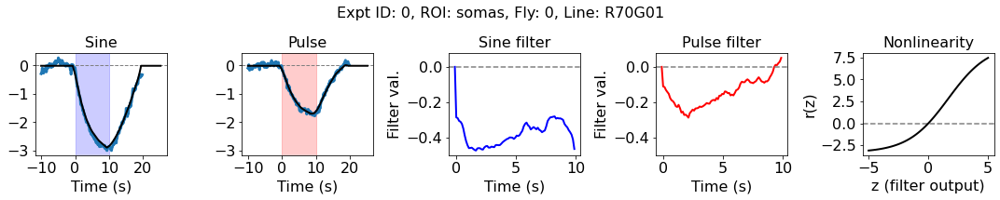

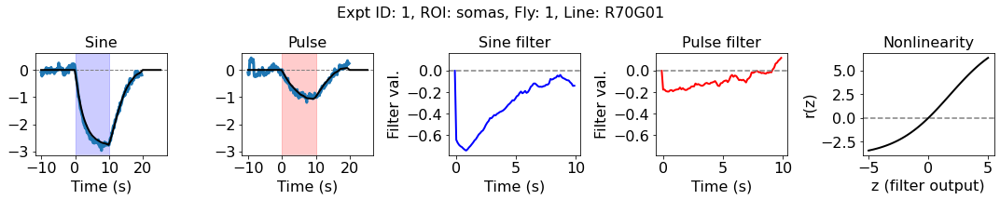

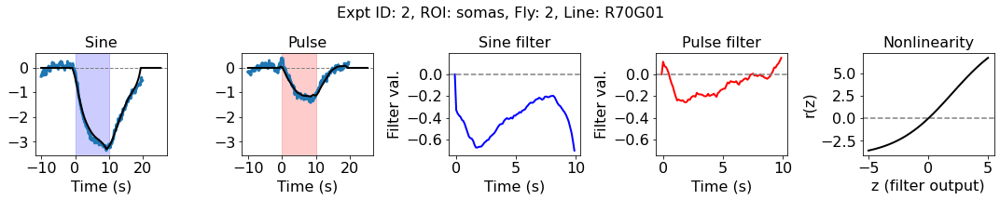

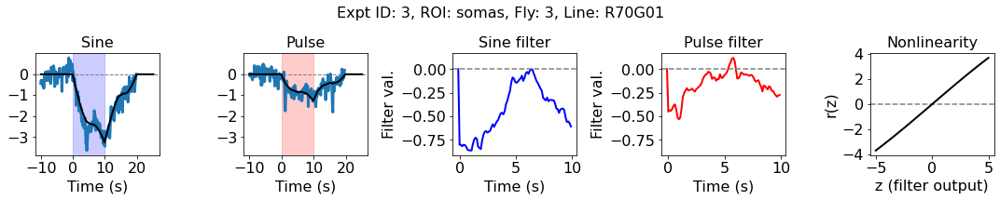

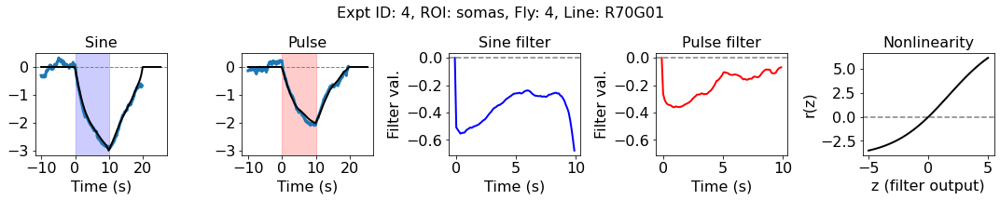

...

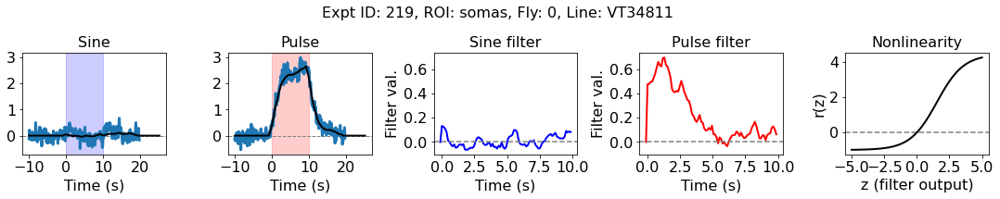

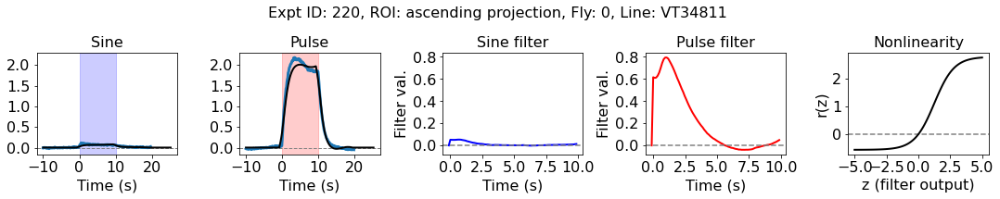

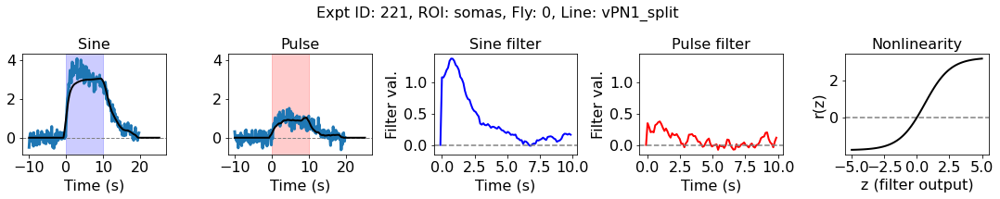

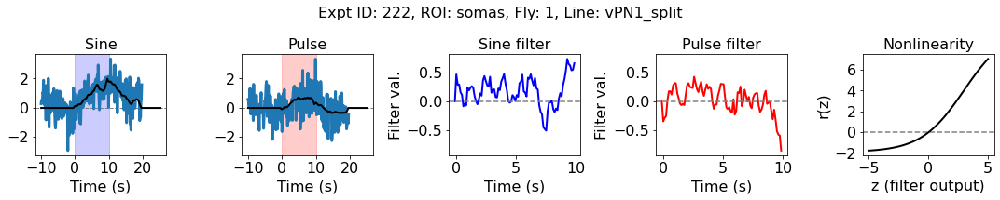

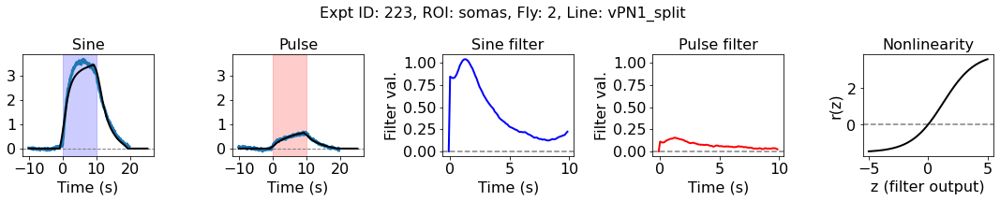

In [7]:
expt_ids_plot = np.arange(len(df_param_lnr))
nroi_plot = len(expt_ids_plot)
t = np.arange(NT)*DT - 10

znl = np.linspace(-5, 5, 101)

for cexpt, expt_id in enumerate(expt_ids_plot):
    fig = plt.figure(figsize=(15, 3), tight_layout=True)
    axs = [fig.add_subplot(1, 5, 1)]
    axs.append(fig.add_subplot(1, 5, 2, sharey=axs[0]))
    axs.append(fig.add_subplot(1, 5, 3))
    axs.append(fig.add_subplot(1, 5, 4, sharey=axs[2]))
    axs.append(fig.add_subplot(1, 5, 5))
    
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    axs[0].axhline(0, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s, lw=3)
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(0, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p, lw=3)
    
    # prediction
    ## sine response
    row_s = df_pred_lnr[(df_pred_lnr['EXPT_ID'] == expt_id) & (df_pred_lnr['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s, lw=2, c='k')
    
    ## pulse response
    row_p = df_pred_lnr[(df_pred_lnr['EXPT_ID'] == expt_id) & (df_pred_lnr['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p, lw=2, c='k')
    
    for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
        ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
        ax.set_title(stim)
        ax.set_xlabel('Time (s)')
        set_plot(ax, x_label='Time (s)', title=stim, font_size=16)
        
    # filters
    axs[2].plot(cc([[-DT], T_H]), cc([[0], h_ss[expt_id]]), lw=2, c='b')
    axs[2].set_title('Sine filter')
        
    axs[3].plot(cc([[-DT], T_H]), cc([[0], h_ps[expt_id]]), lw=2, c='r')
    axs[3].set_title('Pulse filter')
    
    for ax in axs[2:]:
        ax.axhline(0, color='gray', ls='--')
        set_plot(ax, x_label='Time (s)', y_label='Filter val.', font_size=16)
    
    # nonlinearity
    r_min = r_mins[expt_id]
    r_max = r_maxs[expt_id]
    z_0 = z_0s[expt_id]
    beta = betas[expt_id]
    
    axs[4].plot(znl, r_min + (r_max - r_min)*(np.tanh(beta*(znl - z_0)) + 1)/2, lw=2, c='k')
    set_plot(axs[4], x_label='z (filter output)', y_label='r(z)', title='Nonlinearity', font_size=16)
    
    fig.suptitle(f'Expt ID: {expt_id}, ROI: {roi}, Fly: {fly}, Line: {line}', fontsize=16)